In [1]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
from sklearn.linear_model import Lasso
from scipy.io import loadmat
from sklearn.metrics import mean_squared_error
from scipy.integrate import solve_ivp

import pysindy as ps

import os

import math  

# Ignore matplotlib deprecation warnings
import warnings
warnings.filterwarnings("ignore", category=UserWarning)

# Seed the random number generators for reproducibility
np.random.seed(100)

integrator_keywords = {}
integrator_keywords['rtol'] = 1e-12
integrator_keywords['method'] = 'LSODA'
integrator_keywords['atol'] = 1e-12

addp=7
startp=80
endp=120
dp=endp-startp

In [2]:
def miscore(predtmp,oritmp):
    score=1
    pred=np.ravel(predtmp)
    ori=np.ravel(oritmp)
    n=0
    for i in range(len(pred)):
        if ori[i]!=0:
            n=n+1
    #print(n)
    for i in range(len(pred)):
        if ori[i]!=0:
            score=score-1/n*abs((abs(pred[i])-abs(ori[i]))/(abs(pred[i])+abs(ori[i])))
            #print(abs(pred[i]-ori[i])/abs(ori[i]))
    print('MI:')
    print(score)
    return score

In [3]:
def siscore(predtmp,oritmp):
    score=0
    n=1
    sh=predtmp.shape
    if sh!=oritmp.shape:
        print('len not match')
        return 1
    for i in range(len(sh)-1):
        n=n*sh[i]
    pred=predtmp.reshape(n,2)
    ori=oritmp.reshape(n,2)
    n=0
    for i in range(len(pred)):
        if ori[i,0]!=0 and ori[i,1]!=0:
            n=n+1
    #print(n)
    for i in range(len(pred)):
        if ori[i,0]!=0 and ori[i,1]!=0:
            score=score+1/n*abs((ori[i,0]*pred[i,0]+ori[i,1]*pred[i,1])/math.sqrt(pred[i,0]*pred[i,0]+pred[i,1]*pred[i,1])/math.sqrt(ori[i,0]*ori[i,0]+ori[i,1]*ori[i,1]))
            #print(abs(pred[i]-ori[i])/abs(ori[i]))
    print('SI:')
    print(score)
    return score

In [4]:

file_path = os.path.join('D:\\', 'hotaidata','sr_C6_01')
x=[]
y=[]
vx=[]
vy=[]
isvalid=[]
xtmp=[]
ytmp=[]
vxtmp=[]
vytmp=[]
isvalidtmp=[]
for root,dirs,files in os.walk(file_path):
    #print(root)
    
    for dir in dirs:
        #print(os.path.join(root,file))

            with open(os.path.join(root,dir,'B00001.dat'), 'r') as f:  
                lines = f.readlines()
                for line in lines[3:]: 
                    num=line.split()
                    xtmp.append(float(num[0]))
                    ytmp.append(float(num[1]))
                    vxtmp.append(float(num[2]))
                    vytmp.append(float(num[3]))
                    isvalidtmp.append(float(num[4]))

            x.append(np.array(xtmp).reshape(25,25))
            y.append(np.array(ytmp).reshape(25,25))
            vx.append(np.array(vxtmp).reshape(25,25))
            vy.append(np.array(vytmp).reshape(25,25))
            isvalid.append(np.array(isvalidtmp).reshape(25,25))
            xtmp=[]
            ytmp=[]
            vxtmp=[]
            vytmp=[]
            isvalidtmp=[]
#
x=np.array(x)
y=np.array(y)
vx=np.array(vx)
vy=np.array(vy)
isvalid=np.array(isvalid)

x=x.T
y=y.T
vx=vx.T
vy=vy.T
#print(x[0,:,:])
t=np.linspace(0,60/800,121)
dt=0.00002

t=t[startp:endp]
print(len(t))
t_train=np.linspace(t[0],t[-1],addp*(len(t)-1)+1)
dt_train=t_train[1]-t_train[0]
print(len(t_train.shape))

40
1


In [5]:
#u is not pre adding, v add a median
spatial_grid = np.asarray([x[:,:,0].T,y[:,:,0].T]).T

n=25

u=np.zeros((n,n,121, 2))

u[:, :, :, 0] = vx
u[:, :, :, 1] = vy
u_train=np.zeros((n,n,len(t), 2))

u_train=u[:,:,startp:endp,:]

v_train=np.zeros((n,n,len(t_train),2))

for i in range(len(t)-1):
    for j in range(addp):
        v_train[:,:,addp*i+j]=(u_train[:,:,i]*(addp-j)+u_train[:,:,i+1]*j)/addp
v_train[:,:,-1]=u_train[:,:,-1]


In [6]:
v_train_dot = ps.FiniteDifference(axis=2)._differentiate(v_train, dt_train)

vtmp=np.zeros(v_train_dot.shape)
vtmp[:,:,0]=v_train[:,:,0]
for i in range(len(t_train)-1):
    vtmp[:,:,i+1]=vtmp[:,:,i]+v_train_dot[:,:,i]*dt_train
miscore(vtmp,v_train)

vtmp=v_train+v_train_dot*dt_train

vtmp[:,:,1:]=vtmp[:,:,:len(t_train)-1]
miscore(vtmp,v_train)
siscore(vtmp,v_train)


MI:
0.9511316809468425
MI:
0.9918195677580754
SI:
0.9995816177568254


0.9995816177568254

In [7]:
# Define PDE library that is quadratic in u, and
# fourth-order in spatial derivatives of u.
library_functions = [
    lambda y: y,
    lambda x: x * x,

    lambda x, y: x * y * y,
    lambda x, y: x * x * y,
]
library_function_names = [
    lambda y: y,
    lambda x: x + x,

    lambda x, y: x + y + y,
    lambda x, y: x + x + y,
]
pde_lib = ps.PDELibrary(
    library_functions=library_functions,
    function_names=library_function_names,
    derivative_order=2,
    spatial_grid=spatial_grid,
    include_bias=True,
    is_uniform=True,
    periodic=True
)


# Again, loop through all the optimizers
#print('STLSQ model: ')
print('v_train')
print(v_train.shape)

'''
print('SINDy')
model = ps.SINDy(feature_names=['Vx','Vy'])

model.fit(u_train, x_dot=u_dot_train)
model.print()
u_dot_stlsq = model.predict(u_train)

'''
print('STLSQ model: ')
optimizer = ps.STLSQ(threshold=50, alpha=1e-5, 
                     normalize_columns=True, max_iter=200)
model = ps.SINDy(feature_library=pde_lib, optimizer=optimizer,feature_names=['Vx','Vy'])
model.fit(v_train, dt_train)
model.print()
'''
print('SR3 model, L0 norm: ')
optimizer = ps.SR3(threshold=7, max_iter=10000, tol=1e-15, nu=1e2,
                   thresholder='l0', normalize_columns=True)
model = ps.SINDy(feature_library=pde_lib, optimizer=optimizer,feature_names=['Vx','Vy'])
model.fit(u_train, t=dt)
model.print()


print('SR3 model, L1 norm: ')
optimizer = ps.SR3(threshold=0.05, max_iter=10000, tol=1e-15,
                   thresholder='l1', normalize_columns=True)

model = ps.SINDy(feature_library=pde_lib, optimizer=optimizer)
model.fit(u_train, x_dot=u_dot_train)
model.print()'''

v_train
(25, 25, 274, 2)
STLSQ model: 
(Vx)' = 41.366 1 + 33.533 Vx + 30.747 Vy + 4.651 VxVx + 5.195 VyVy + -0.501 VxVyVy + -0.867 VxVxVy + 102.670 Vx_2 + 69.269 Vy_2 + 65.945 Vx_22 + 212.811 Vy_22 + 132.385 Vx_1 + -108.261 Vy_1 + 330.429 Vx_12 + -177.849 Vy_12 + 11.505 Vx_11 + -31.179 Vy_11 + -2.256 VxVx_2 + -175.124 VxVy_2 + 0.266 VyVx_2 + -1.326 VyVy_2 + 1.011 VxVxVx_2 + 1.202 VxVxVy_2 + 93.622 VyVyVx_2 + 10.511 VyVyVy_2 + -0.838 VxVyVyVx_2 + -1.037 VxVyVyVy_2 + 0.154 VxVxVyVx_2 + 0.082 VxVxVyVy_2 + -2.512 VxVx_22 + 69.827 VxVy_22 + 1.114 VyVx_22 + -0.865 VyVy_22 + -0.329 VxVxVx_22 + -1.223 VxVxVy_22 + -23.364 VyVyVx_22 + -4.212 VyVyVy_22 + -6.478 VxVyVyVx_22 + 4.445 VxVyVyVy_22 + -0.730 VxVxVyVx_22 + -1.066 VxVxVyVy_22 + 31.289 VxVx_1 + 65.404 VxVy_1 + -0.760 VyVx_1 + -0.639 VyVy_1 + -0.867 VxVxVx_1 + 0.325 VxVxVy_1 + 25.930 VyVyVx_1 + -8.748 VyVyVy_1 + 1.699 VxVyVyVx_1 + 0.471 VxVyVyVy_1 + -0.208 VxVxVyVx_1 + 0.652 VxVxVyVy_1 + -31.892 VxVx_12 + -41.164 VxVy_12 + -0.503 VyVx_12 + 

"\nprint('SR3 model, L0 norm: ')\noptimizer = ps.SR3(threshold=7, max_iter=10000, tol=1e-15, nu=1e2,\n                   thresholder='l0', normalize_columns=True)\nmodel = ps.SINDy(feature_library=pde_lib, optimizer=optimizer,feature_names=['Vx','Vy'])\nmodel.fit(u_train, t=dt)\nmodel.print()\n\n\nprint('SR3 model, L1 norm: ')\noptimizer = ps.SR3(threshold=0.05, max_iter=10000, tol=1e-15,\n                   thresholder='l1', normalize_columns=True)\n\nmodel = ps.SINDy(feature_library=pde_lib, optimizer=optimizer)\nmodel.fit(u_train, x_dot=u_dot_train)\nmodel.print()"

In [8]:
print("Model score: %f" % model.score(u_train, t=t))
print("Model score: %f" % model.score(u_train, t=dt))
print("Model score: %f" % model.score(v_train, t=t_train))
print("Model score: %f" % model.score(v_train, t=dt_train))

Model score: 0.026619
Model score: -0.002881
Model score: 0.015210
Model score: 0.015210


In [9]:
x_dot_test_predicted = model.predict(v_train)
tlen=len(t_train)
dot_tmp=np.array(x_dot_test_predicted)
pltpredict=np.zeros((n,n,tlen,2))


In [10]:
pltpredict=v_train+dot_tmp*dt_train
pltpredict[:,:,1:]=pltpredict[:,:,:len(t_train)-1]
miscore(pltpredict,v_train)
siscore(pltpredict,v_train)

MI:
0.9358303888664037
SI:
0.996541990398965


0.996541990398965

0


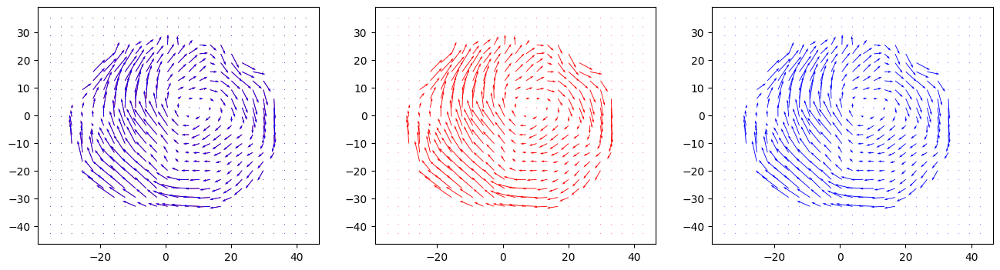

MI:
0.9899226726075596
SI:
0.9999810711880432
1


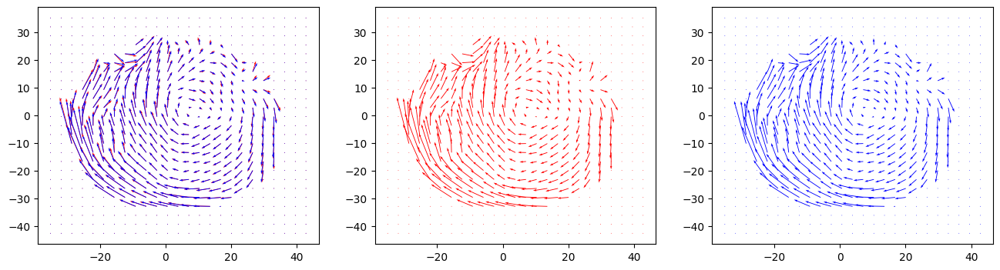

MI:
0.9283096600757897
SI:
0.9961420815870337
2


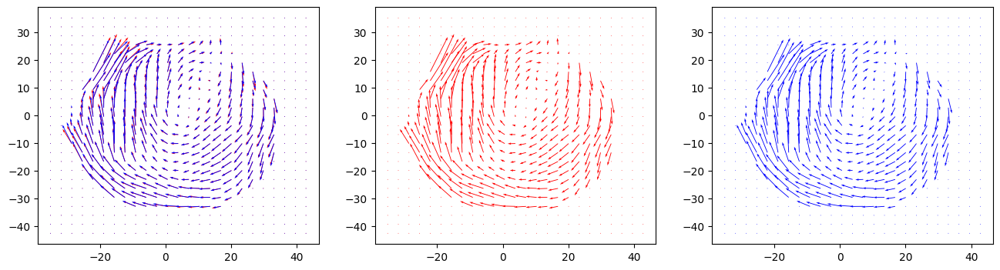

MI:
0.9195462375108109
SI:
0.9917341359213677
3


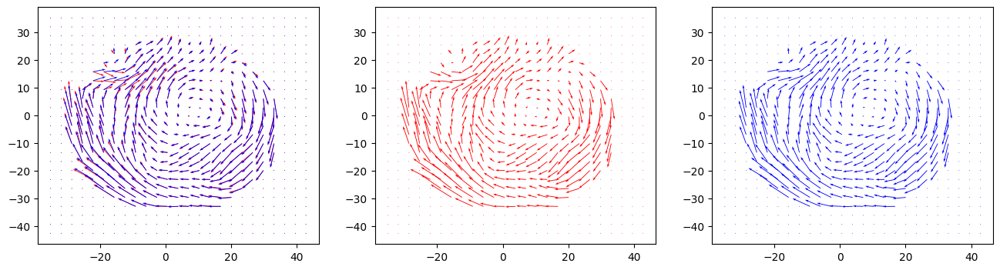

MI:
0.9271088235128059
SI:
0.9912937847794902
4


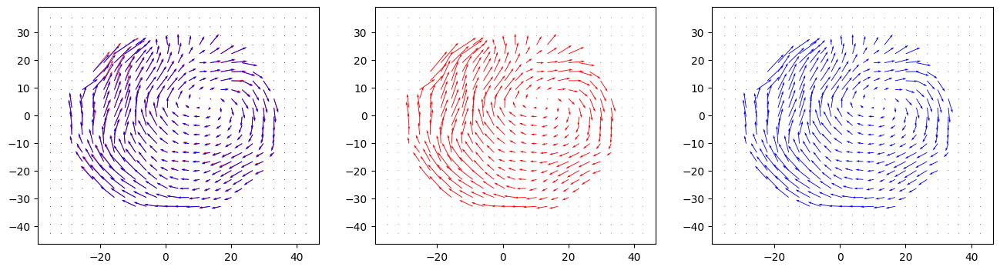

MI:
0.930919781290244
SI:
0.998380482695131
5


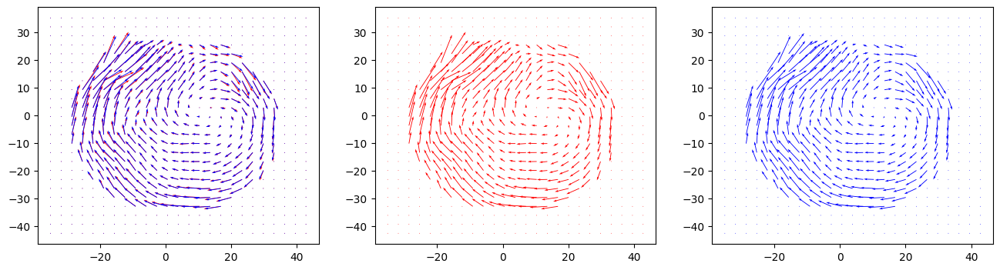

MI:
0.9395648454415998
SI:
0.9963193787161587
6


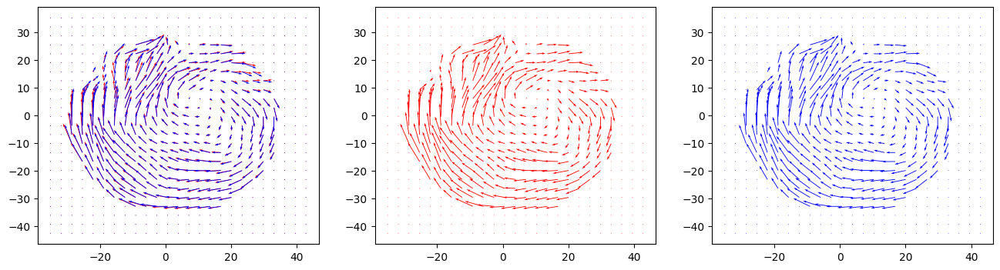

MI:
0.9157156659118801
SI:
0.9954843502005999
7


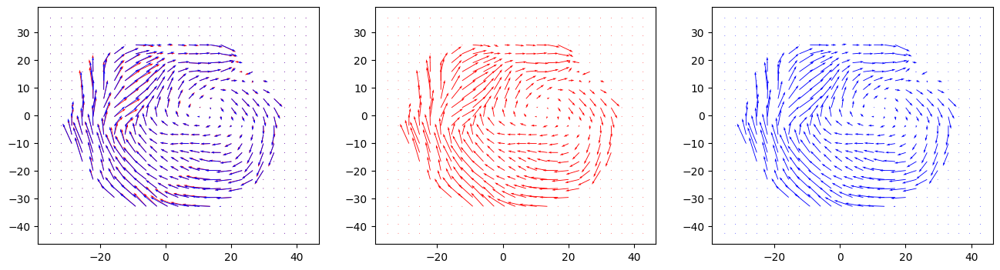

MI:
0.9238570287445057
SI:
0.9972498056757917
8


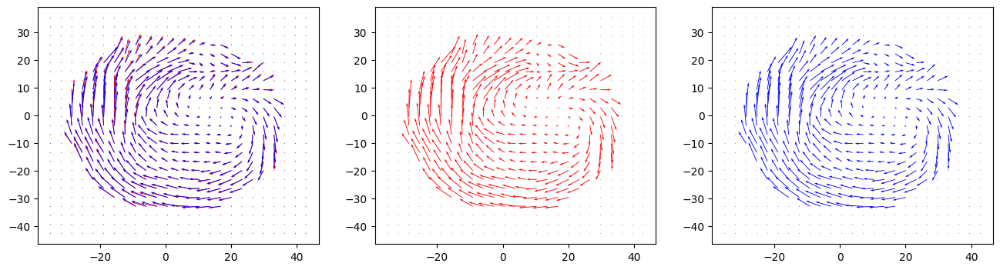

MI:
0.9218487451058103
SI:
0.997784324205864
9


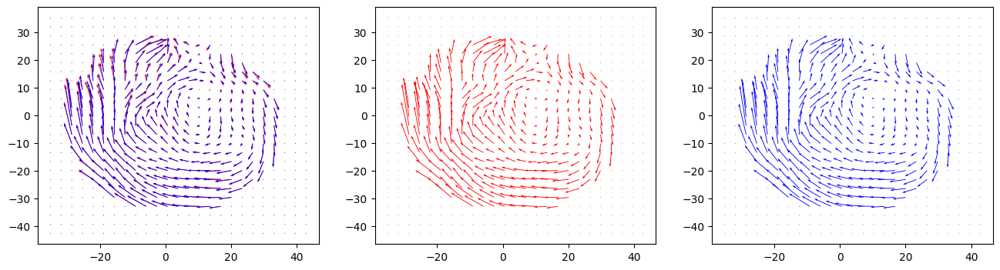

MI:
0.9122165945599578
SI:
0.9934371780257127
10


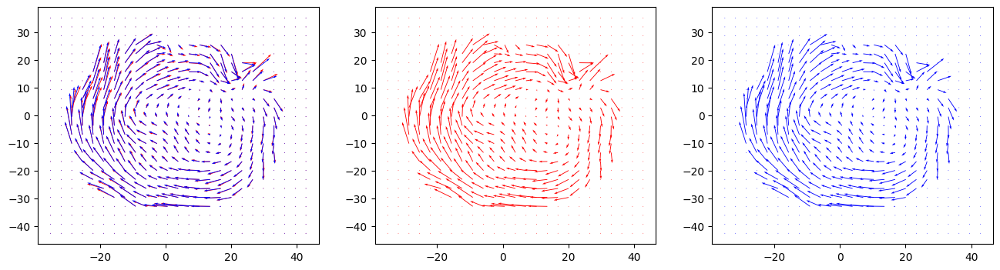

MI:
0.930510774739256
SI:
0.9920739848773032
11


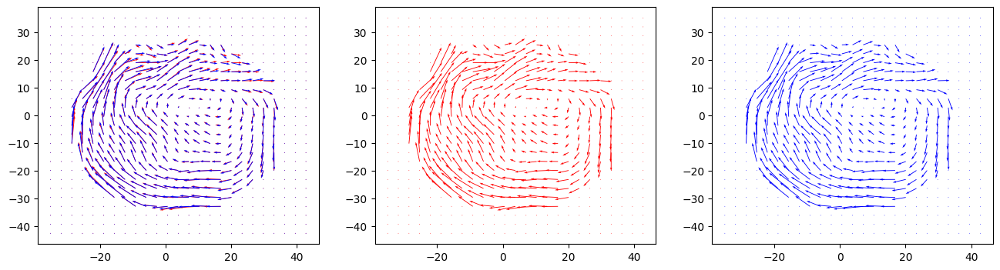

MI:
0.9170583985688459
SI:
0.99679035987789
12


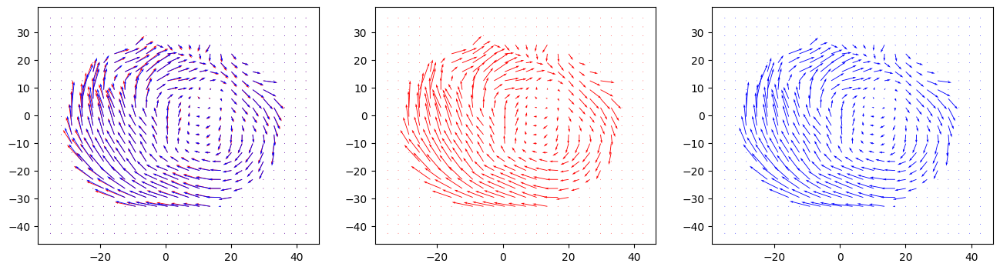

MI:
0.9268087115811465
SI:
0.9959688239663105
13


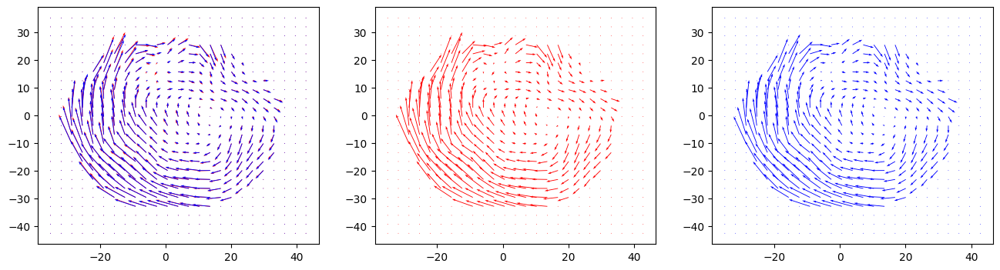

MI:
0.9176305285475024
SI:
0.9835616138261577
14


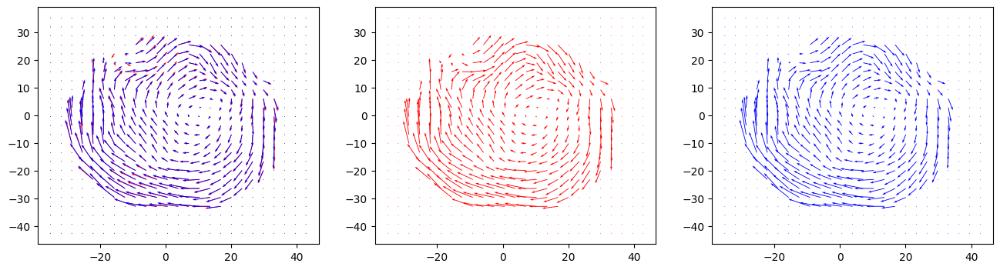

MI:
0.927614065975895
SI:
0.9933703994390158
15


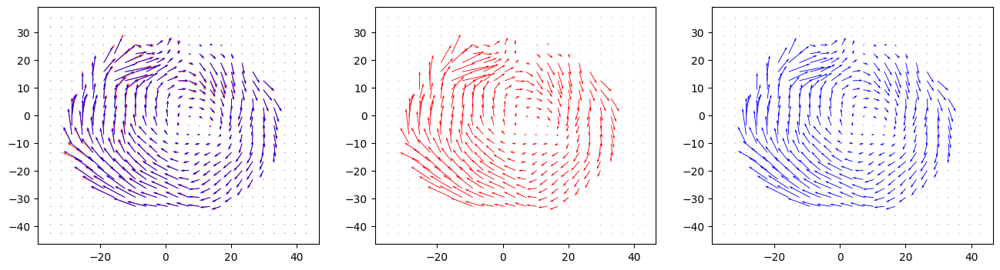

MI:
0.9249153127593195
SI:
0.9931010412739034
16


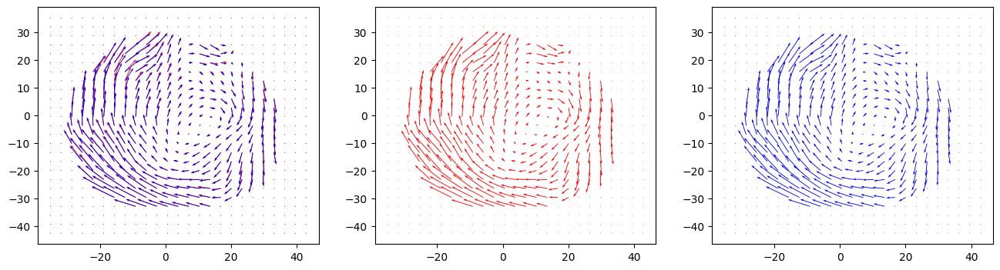

MI:
0.9290845594314906
SI:
0.9965102663253959
17


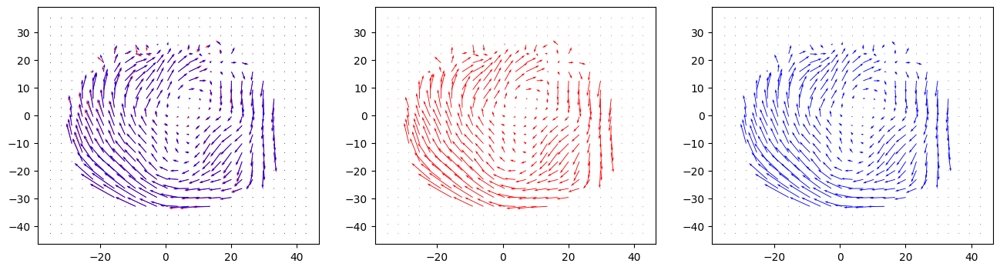

MI:
0.9104948333945873
SI:
0.9862674647722541
18


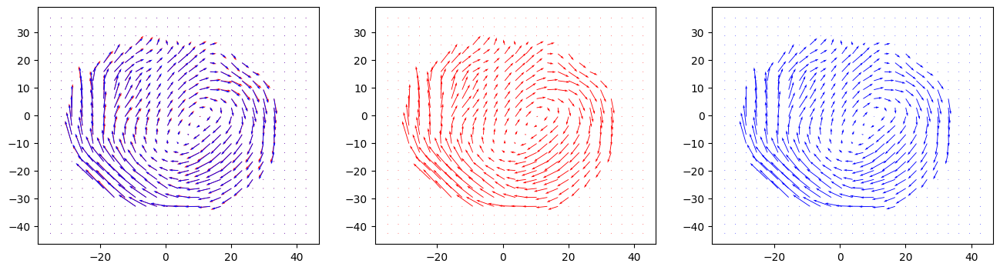

MI:
0.9374531085014357
SI:
0.9983516483847437
19


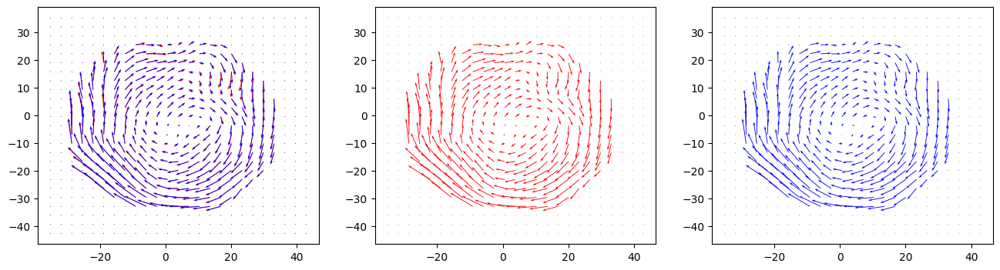

MI:
0.9192549716697719
SI:
0.9956049494409778
20


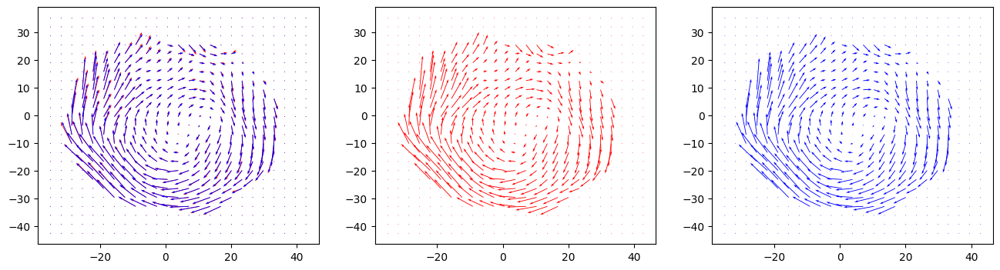

MI:
0.9460024658987202
SI:
0.9951548680270068
21


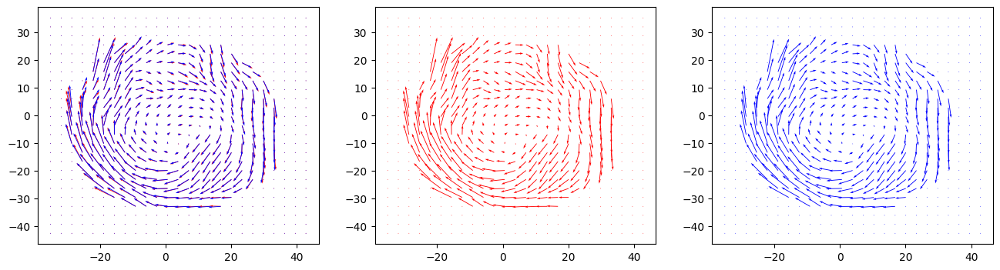

MI:
0.934938733214922
SI:
0.9986910305149944
22


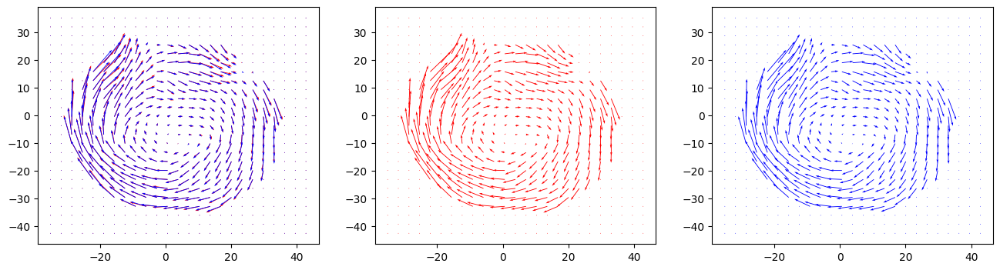

MI:
0.9435615820318772
SI:
0.9976833518457737
23


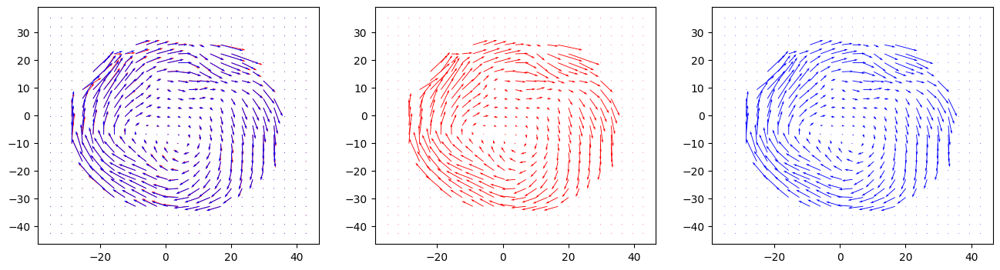

MI:
0.9350911289112831
SI:
0.9974906285893737
24


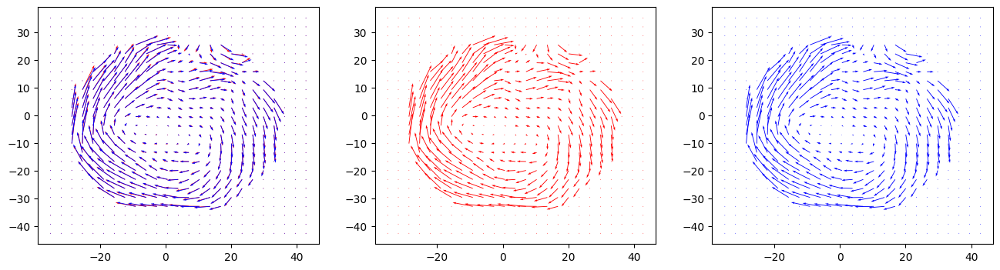

MI:
0.9373139947239488
SI:
0.9971111916797933
25


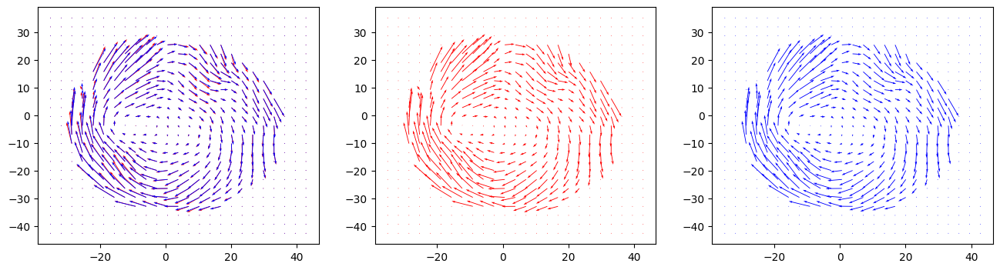

MI:
0.9436742817566437
SI:
0.998029760270773
26


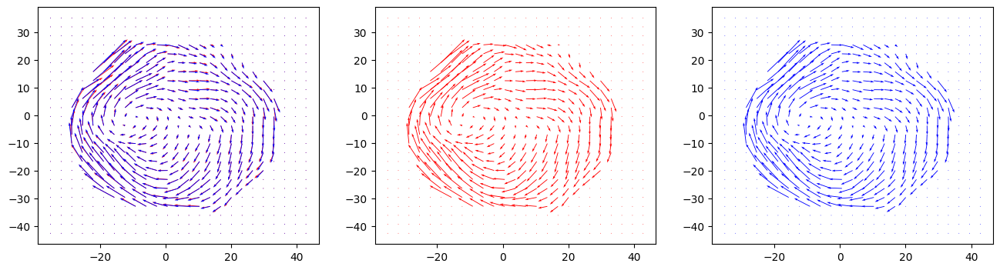

MI:
0.9409685837880299
SI:
0.9978834507559896
27


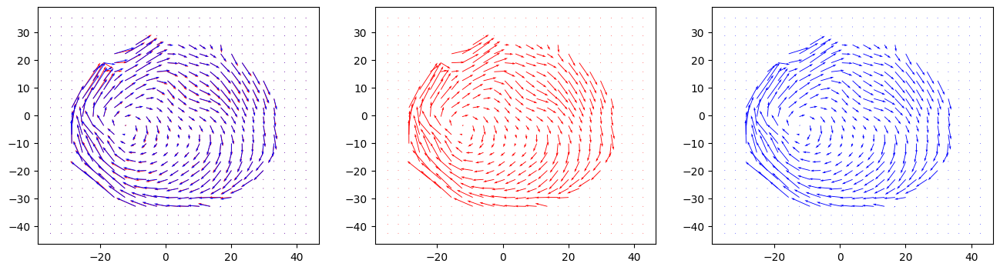

MI:
0.9442921813548764
SI:
0.9983265959180235
28


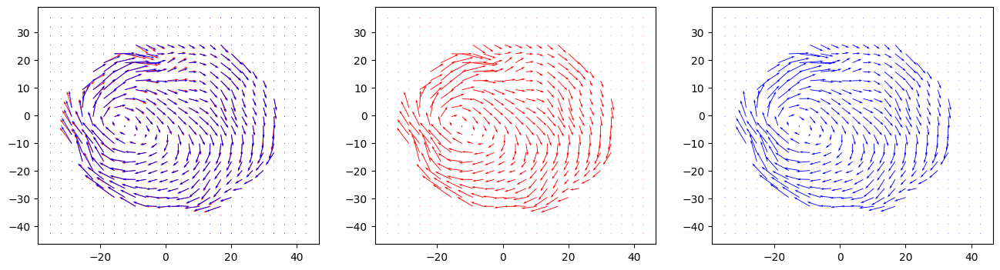

MI:
0.9374459882361088
SI:
0.9985255524545698
29


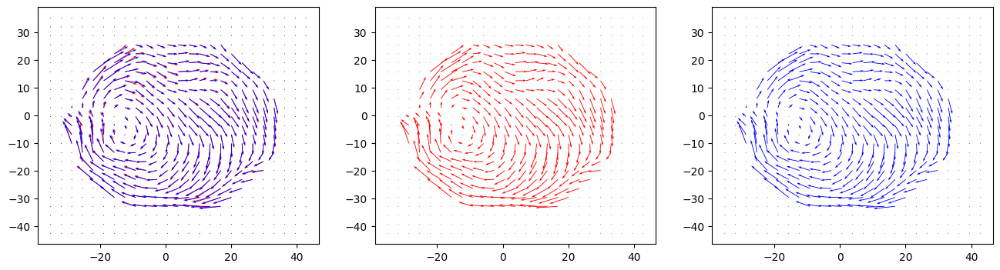

MI:
0.9393254880355101
SI:
0.9919384202300632
30


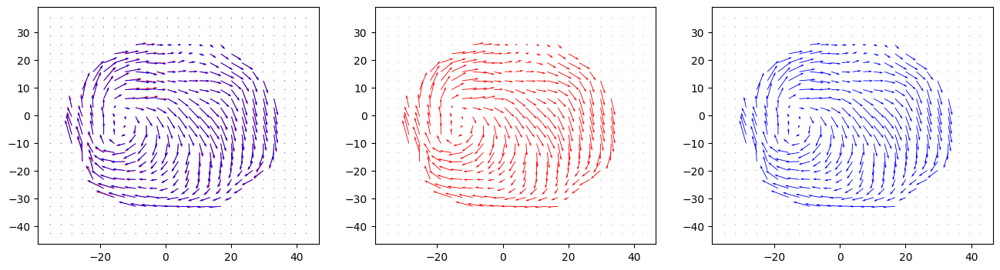

MI:
0.9287361863905993
SI:
0.9988730597554467
31


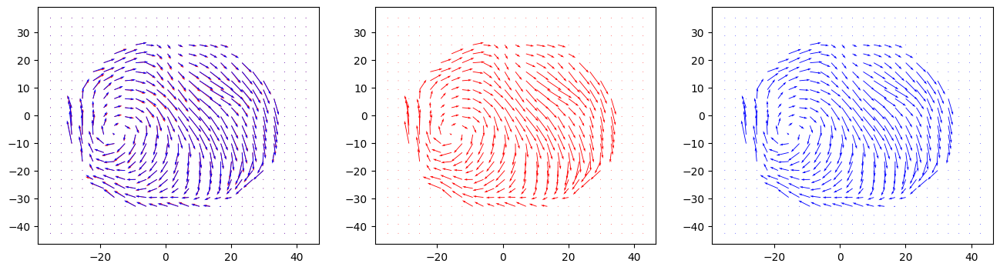

MI:
0.9556224435407942
SI:
0.9985592924715143
32


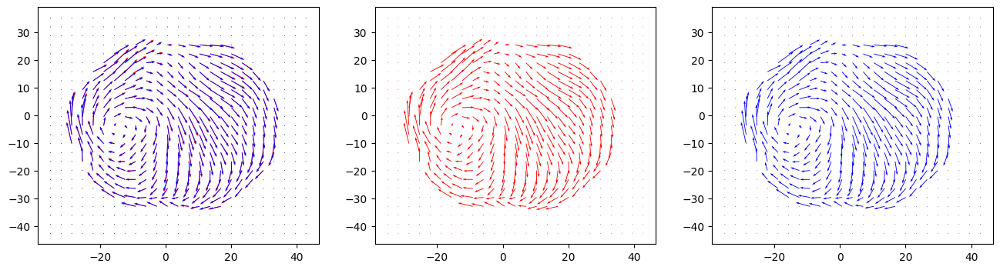

MI:
0.956581419249326
SI:
0.9990595547451111
33


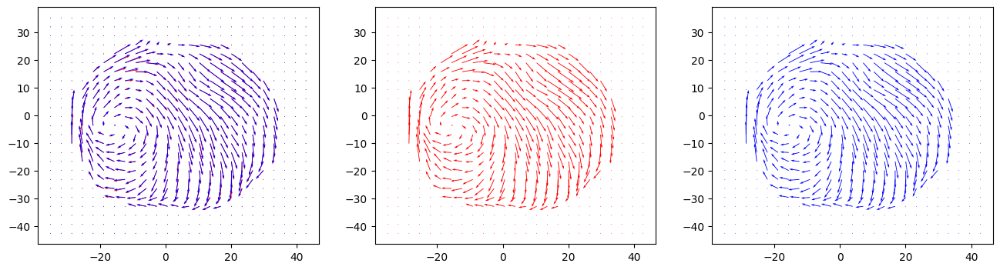

MI:
0.9564542105705429
SI:
0.9993214147771211
34


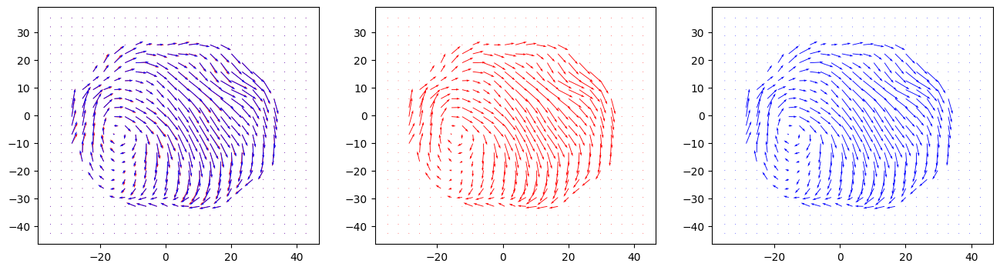

MI:
0.9400608103593033
SI:
0.9979740591817475
35


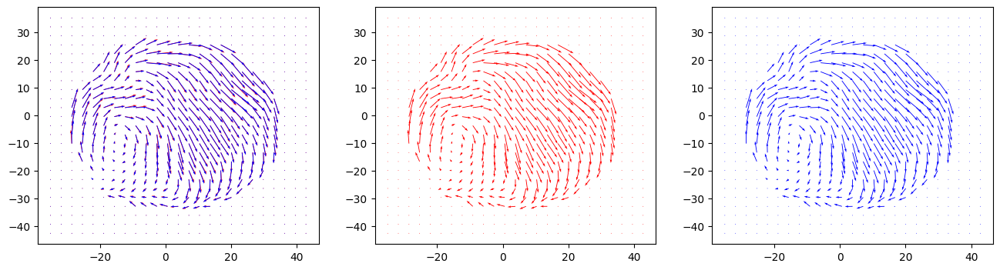

MI:
0.9513985972687705
SI:
0.9986745284064004
36


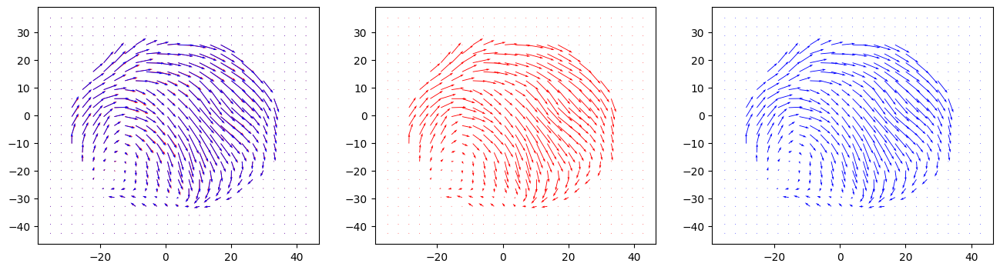

MI:
0.957658175971786
SI:
0.9986001271195496
37


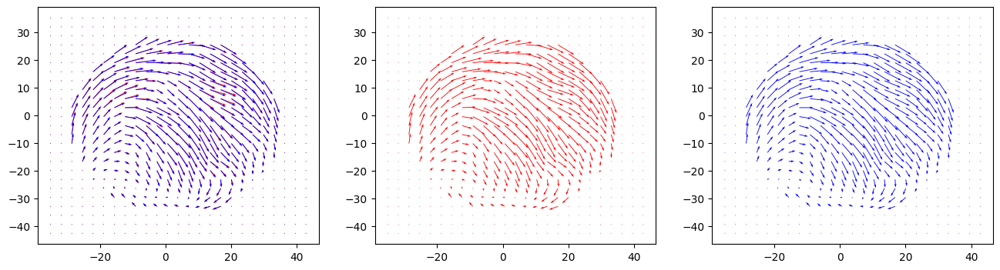

MI:
0.9590318662722865
SI:
0.9980754528364677
38


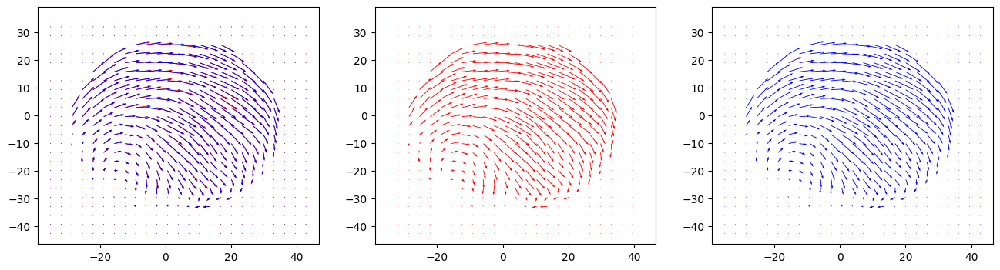

MI:
0.9494140185359651
SI:
0.9960379674327741
39


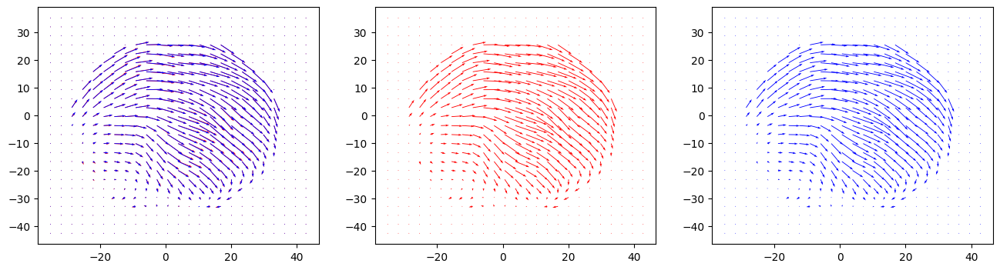

MI:
0.9513042987528206
SI:
0.9976169999413655


In [11]:
for i in range(40):
    print(i)
    j=i*addp
    plt.figure(figsize=(16, 4))
    plt.subplot(1, 3, 1)
    plt.quiver(spatial_grid[:,:,0],spatial_grid[:,:,1],v_train[:,:,j,0],v_train[:,:,j,1],color='r')
    plt.quiver(spatial_grid[:,:,0],spatial_grid[:,:,1],pltpredict[:,:,j,0],pltpredict[:,:,j,1],color='b')
    plt.subplot(1, 3, 2)
    plt.quiver(spatial_grid[:,:,0],spatial_grid[:,:,1],v_train[:,:,j,0],v_train[:,:,j,1],color='r')
    #plt.quiver(spatial_grid[:,:,1],spatial_grid[:,:,0],pltpredict[:,:,i,0],pltpredict[:,:,i,1],color='b')
    plt.subplot(1, 3, 3)
    #plt.quiver(spatial_grid[:,:,1],spatial_grid[:,:,0],u_dot_train[:,:,i+1,0],u_dot_train[:,:,i+1,1],color='r')
    plt.quiver(spatial_grid[:,:,0],spatial_grid[:,:,1],pltpredict[:,:,j,0],pltpredict[:,:,j,1],color='b')
    plt.show()
    miscore(pltpredict[:,:,j,],v_train[:,:,j,:])
    siscore(pltpredict[:,:,j,],v_train[:,:,j,:])

In [12]:
print('add 7 point, with library x^3, derivative order 2, MI:0.6748241001379309, SI:0.8570345301079201')
print('add 7 point, with library x^3, derivative order 1, MI:0.6732771082529756, SI:0.8589308511150588')
print('add 7 point, with library x^2, derivative order 2, MI:0.6707939885275049, SI:0.8459658232811543')
pltpredict[0]=v_train[0]
for i in range(len(t_train)-1):
    pltpredict[:,:,i+1]=pltpredict[:,:,i]+dot_tmp[:,:,i]*dt_train
miscore(pltpredict,v_train)
siscore(pltpredict,v_train)

add 7 point, with library x^3, derivative order 2, MI:0.6748241001379309, SI:0.8570345301079201
add 7 point, with library x^3, derivative order 1, MI:0.6732771082529756, SI:0.8589308511150588
MI:
0.6707939885275049
SI:
0.8459658232811543


0.8459658232811543

0


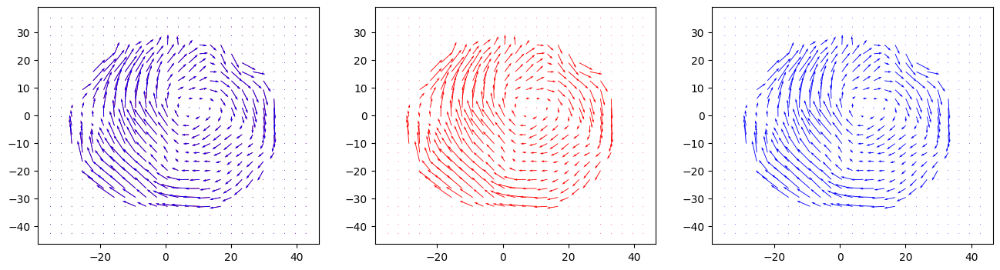

MI:
0.9899226726075596
SI:
0.9999810711880432
1


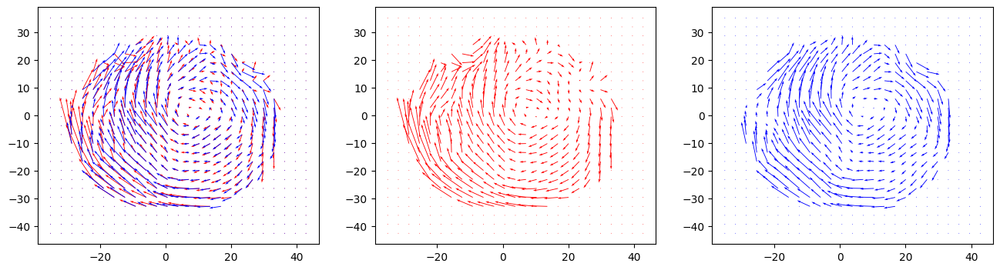

MI:
0.7307039809994751
SI:
0.9190474129792606
2


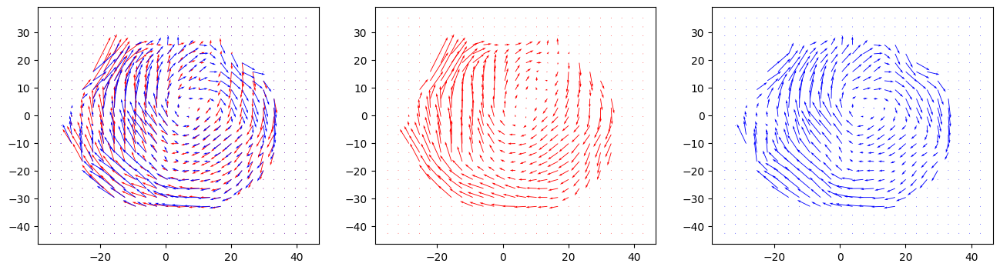

MI:
0.6989079599273929
SI:
0.9008512796045973
3


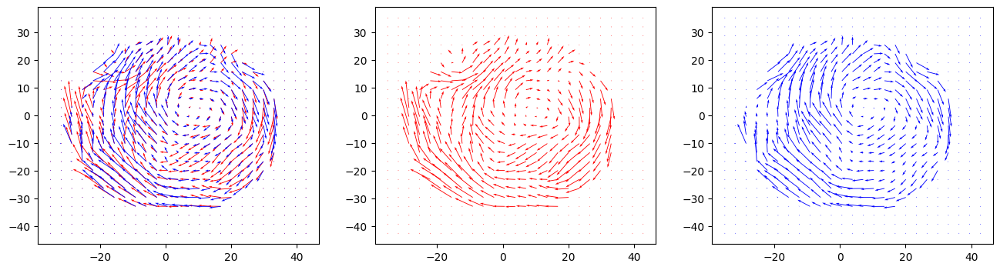

MI:
0.6864963654043683
SI:
0.9069669219780574
4


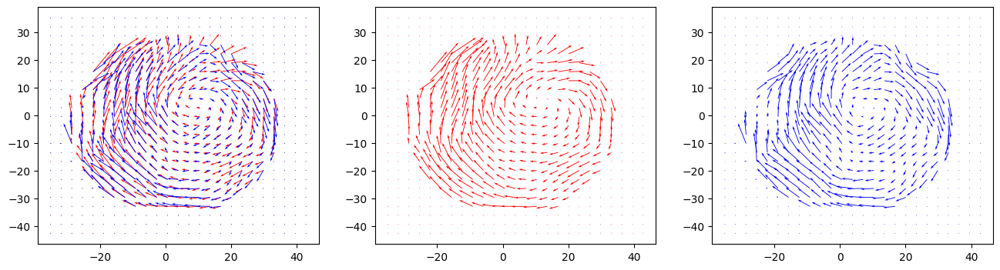

MI:
0.7375587774841388
SI:
0.9185856839233235
5


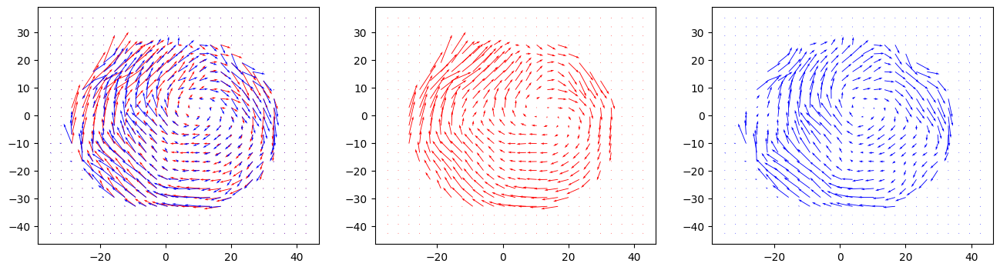

MI:
0.7119393985207588
SI:
0.9250597896043492
6


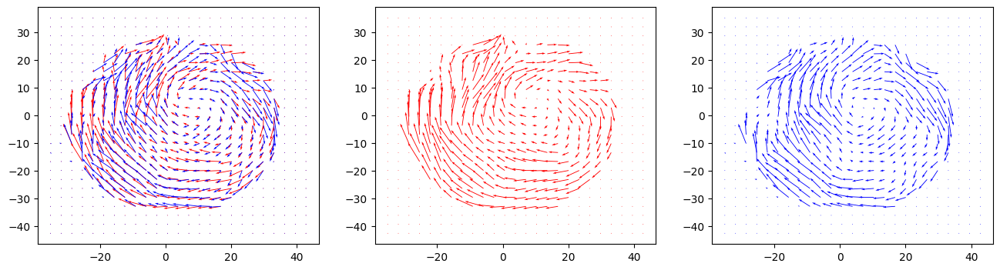

MI:
0.692392016354303
SI:
0.9042578516581065
7


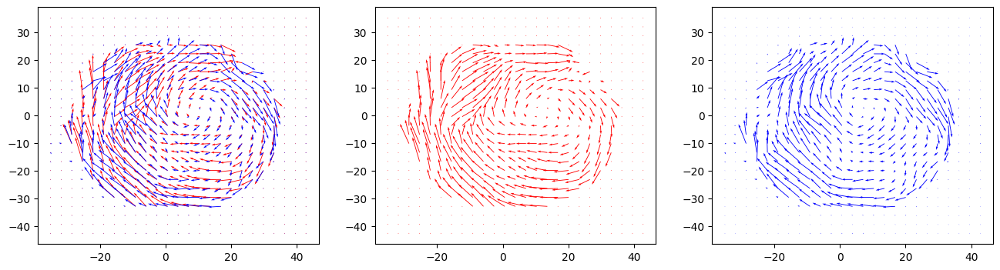

MI:
0.6643885049145636
SI:
0.8582009329194722
8


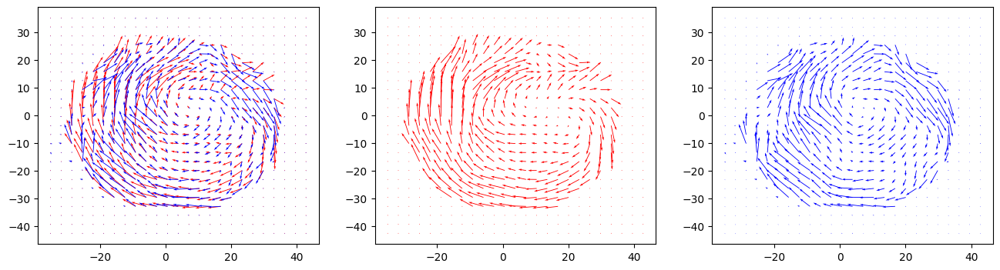

MI:
0.6882186675216572
SI:
0.8637467672827687
9


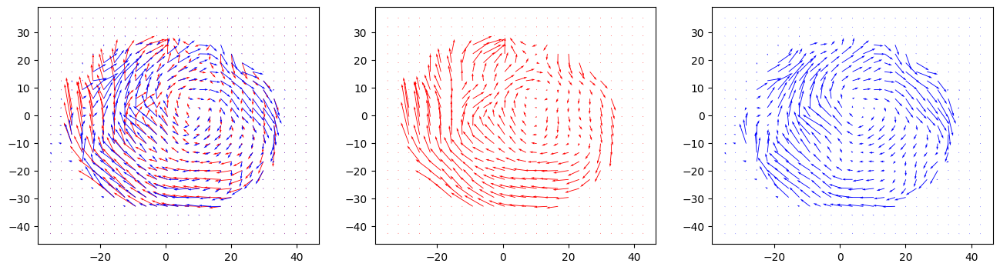

MI:
0.6613353220736667
SI:
0.842446759931446
10


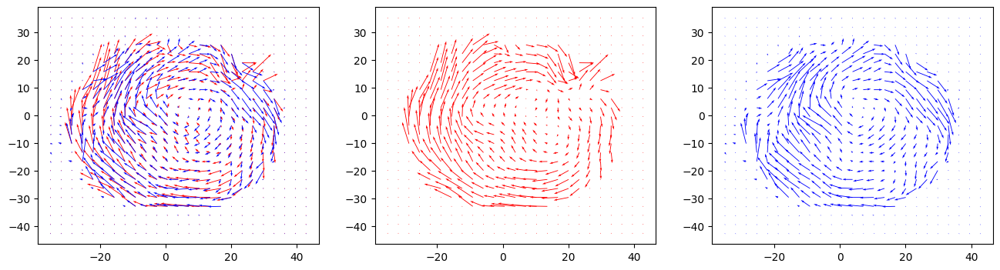

MI:
0.684838112401621
SI:
0.8527239252656389
11


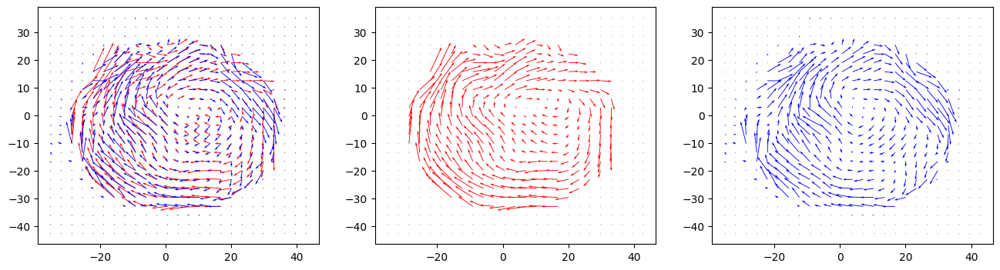

MI:
0.6932932117200706
SI:
0.8637257535749915
12


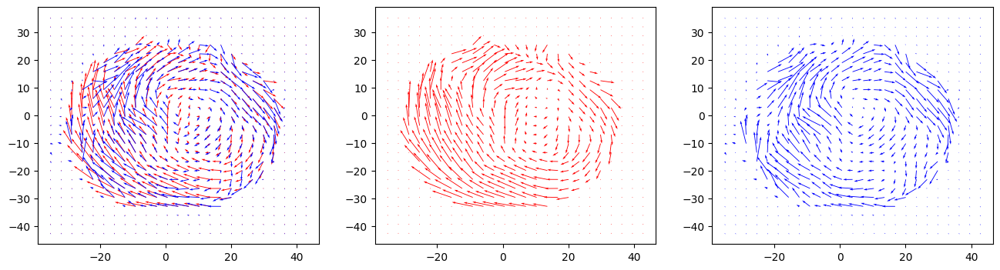

MI:
0.6677603710792287
SI:
0.8434536840326424
13


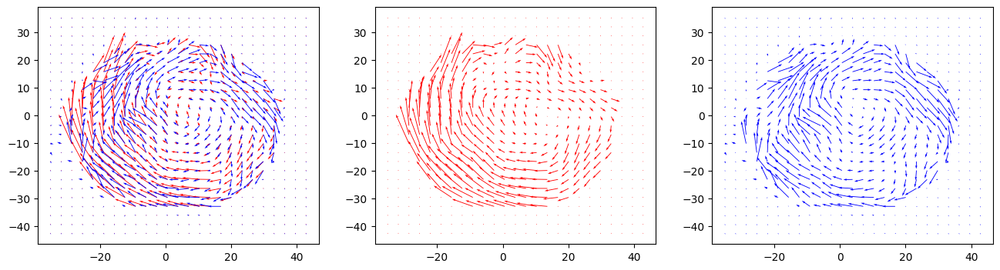

MI:
0.639537843915848
SI:
0.8738242490977356
14


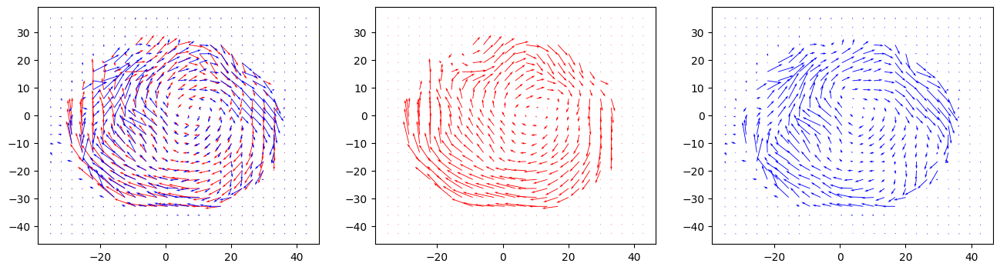

MI:
0.6926017377169905
SI:
0.8675753898778422
15


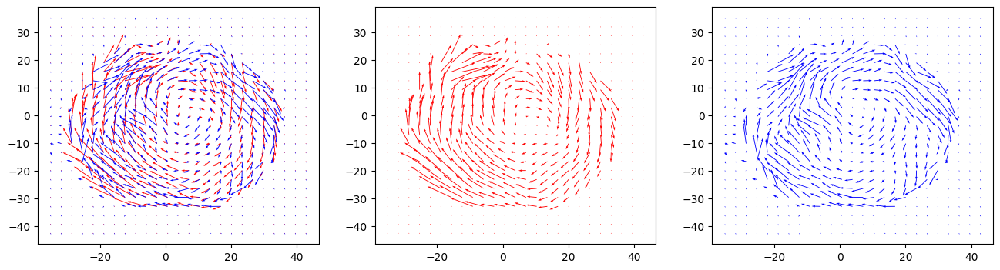

MI:
0.6701157083008076
SI:
0.8611755231079086
16


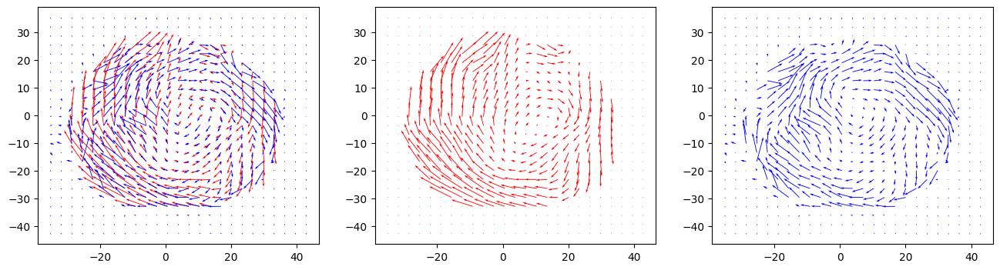

MI:
0.6590841082738105
SI:
0.8362188982570415
17


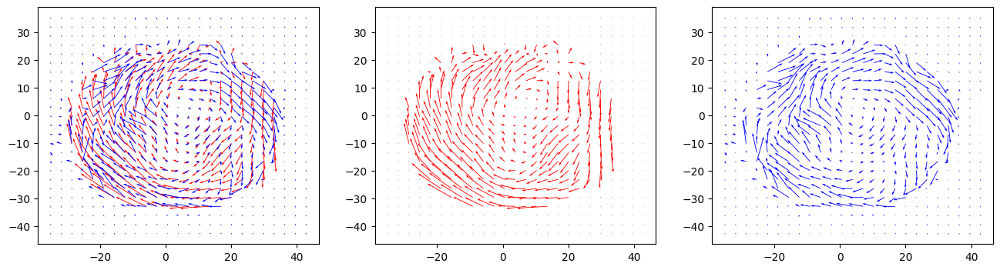

MI:
0.6583126597790712
SI:
0.8151880942922455
18


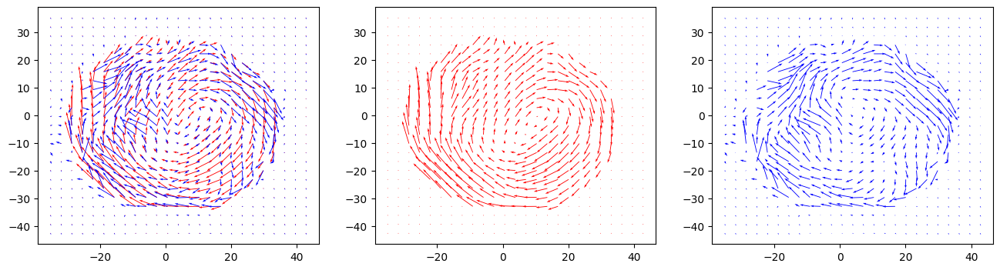

MI:
0.6720012938993009
SI:
0.8376772447894641
19


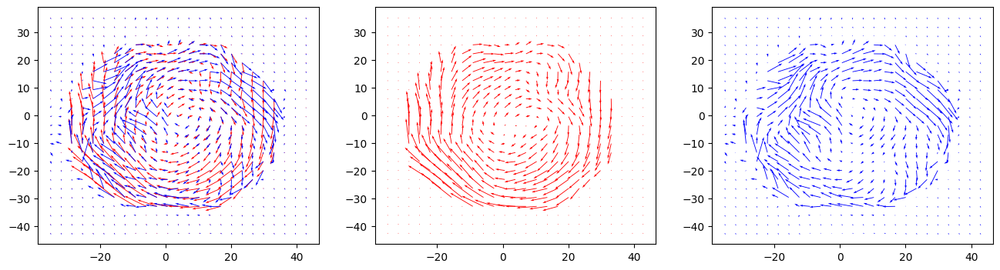

MI:
0.6441164659344898
SI:
0.7985303277092318
20


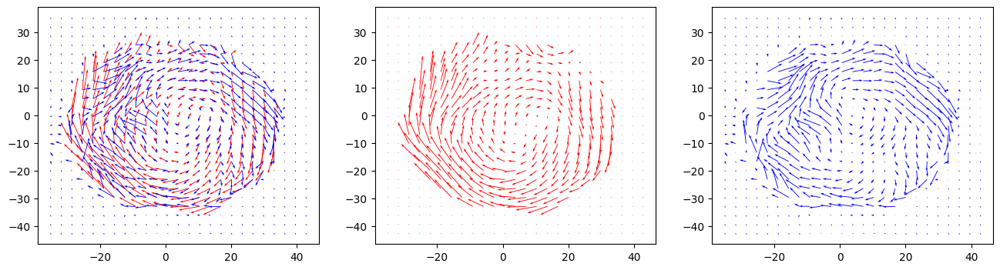

MI:
0.6443217035697413
SI:
0.8314531119943651
21


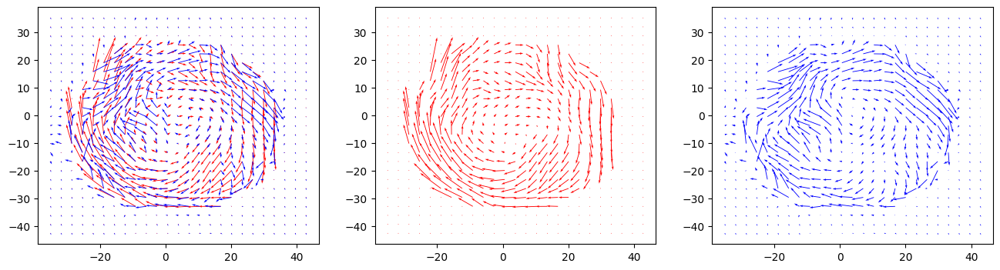

MI:
0.6384122671478
SI:
0.7914189960836125
22


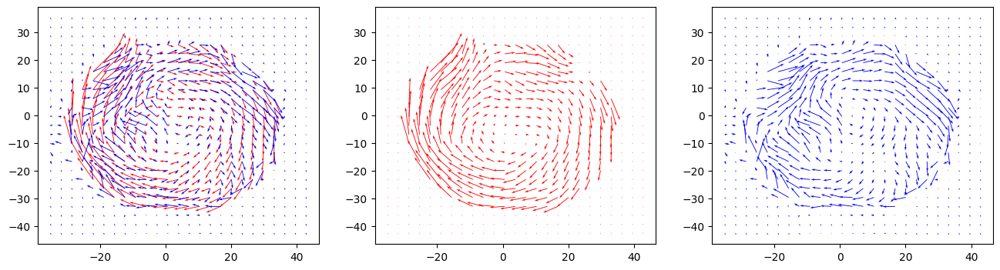

MI:
0.6569336552161087
SI:
0.8136461338956663
23


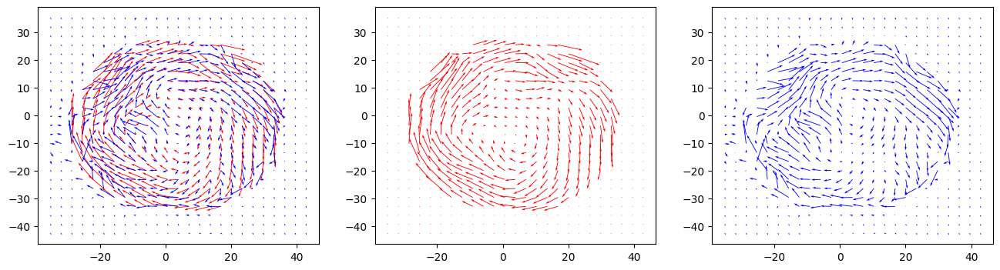

MI:
0.6630820447662688
SI:
0.8590242768908501
24


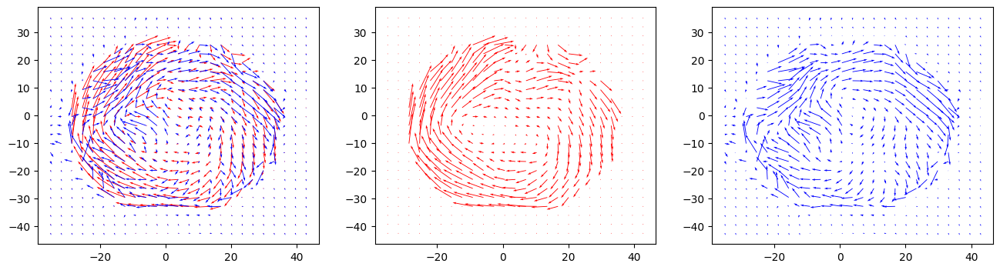

MI:
0.6336505319885064
SI:
0.8171877729626397
25


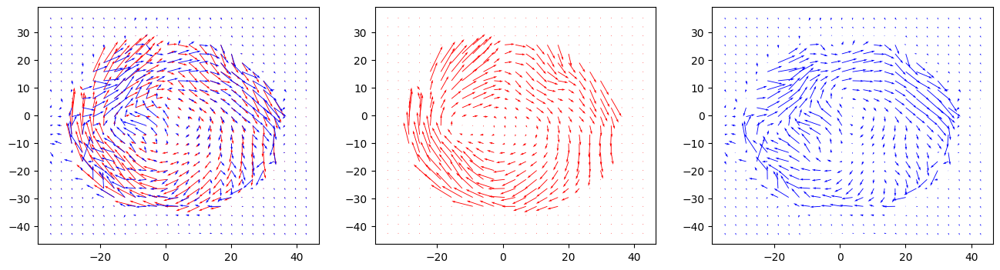

MI:
0.6337112200469034
SI:
0.8089381993820169
26


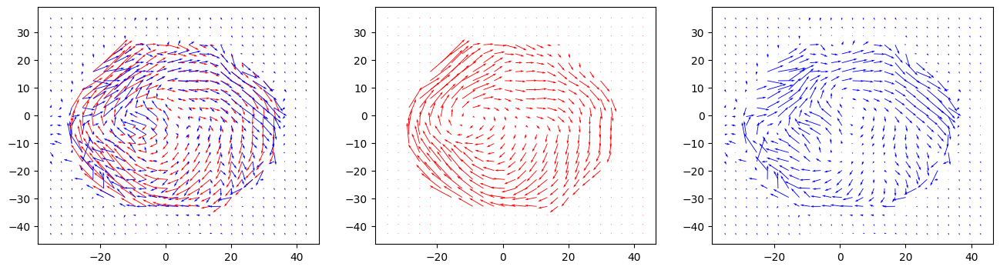

MI:
0.6502290917657318
SI:
0.8147763281093371
27


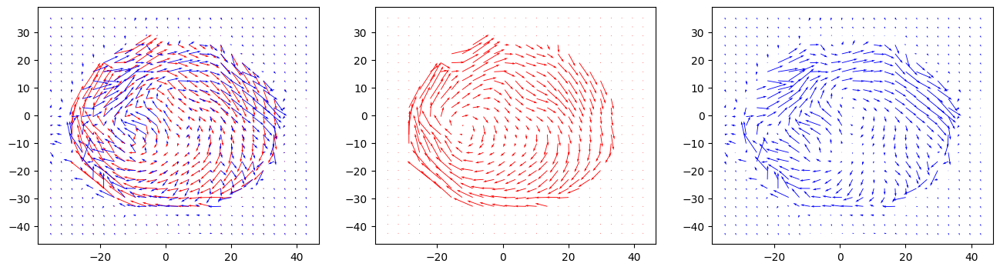

MI:
0.6583615289249707
SI:
0.79274042145818
28


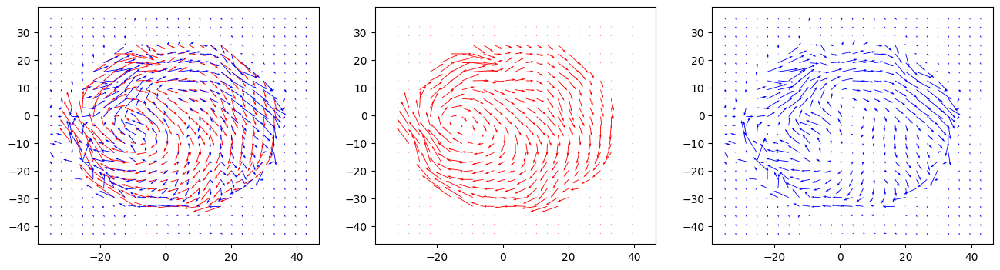

MI:
0.6565071457857856
SI:
0.8011980067170876
29


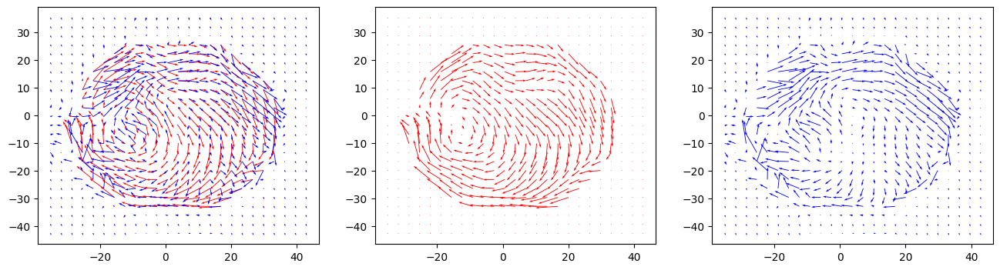

MI:
0.6466878415312122
SI:
0.7768445215833079
30


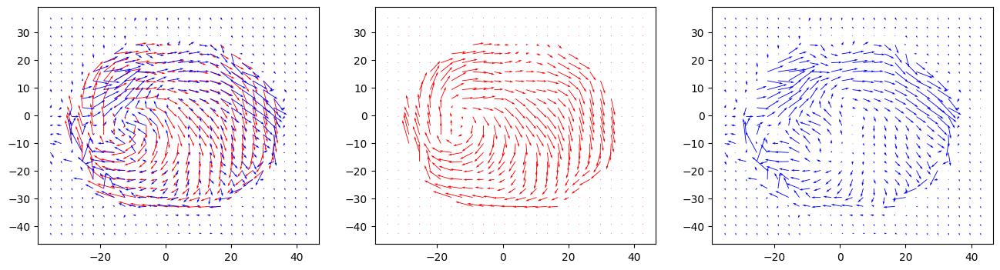

MI:
0.6282041685349871
SI:
0.803825107259791
31


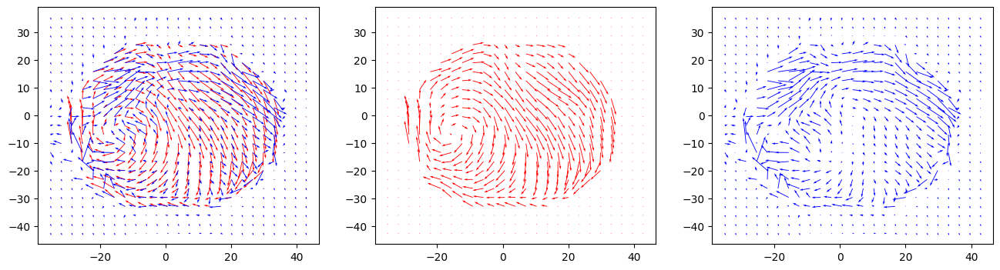

MI:
0.635174249014943
SI:
0.7897364215277518
32


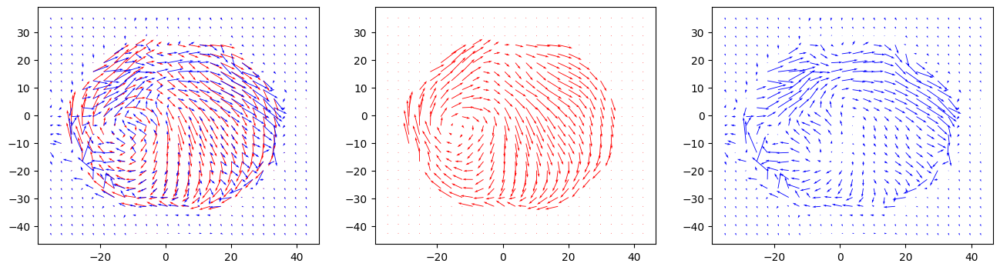

MI:
0.6584211214870086
SI:
0.7843812992296888
33


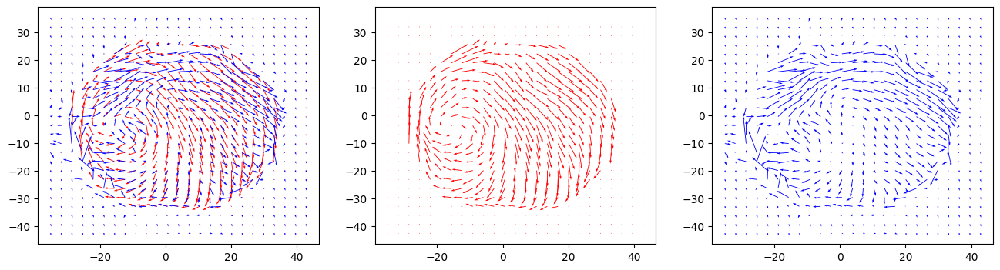

MI:
0.6448027797436967
SI:
0.7946272929953657
34


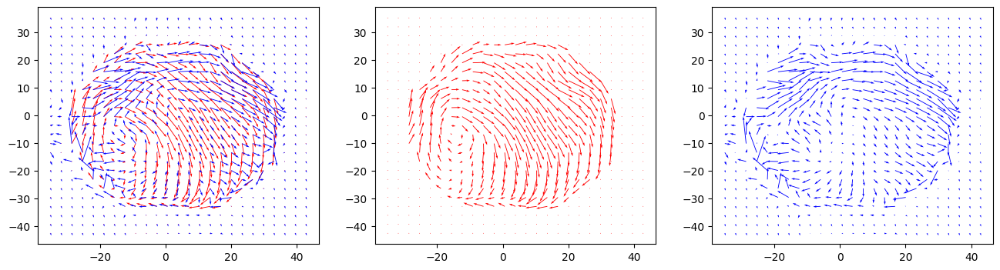

MI:
0.6168383714269531
SI:
0.753167061151999
35


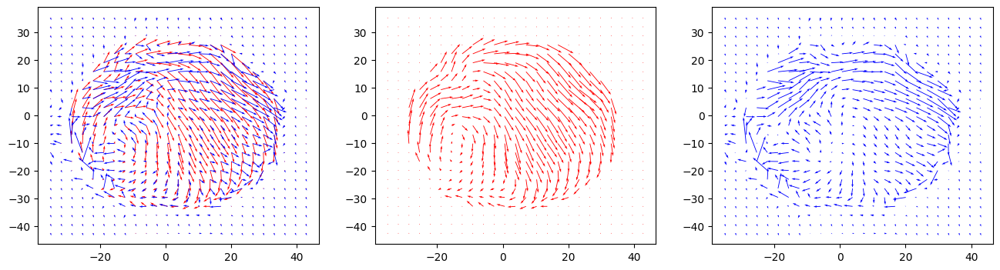

MI:
0.6209491841897875
SI:
0.7614332030529132
36


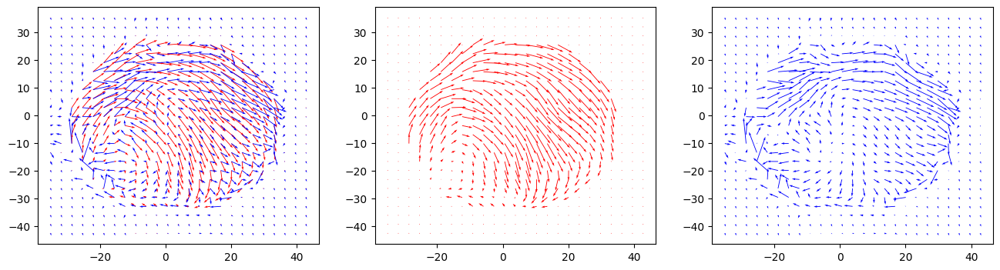

MI:
0.637272878984603
SI:
0.7793047509519675
37


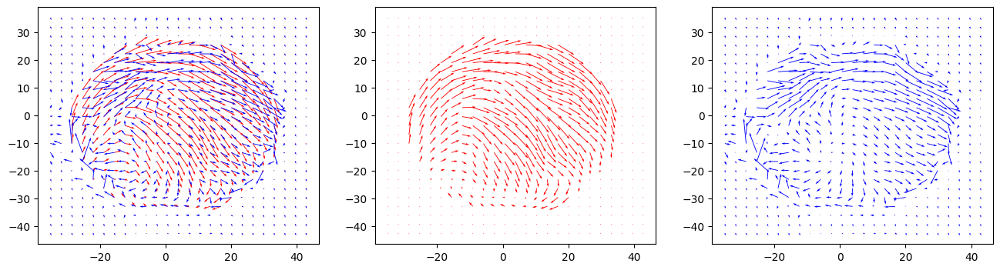

MI:
0.6434408296403803
SI:
0.8154767584586619
38


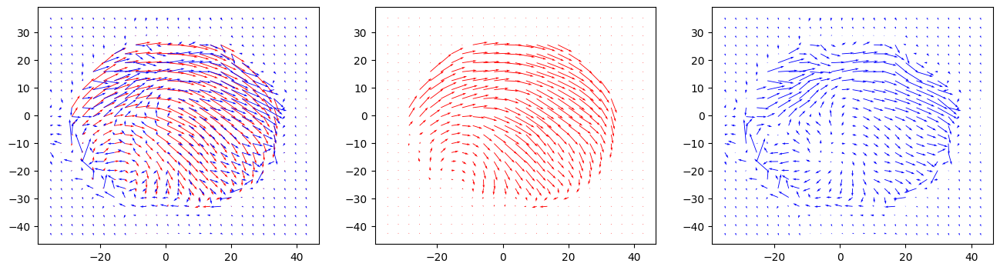

MI:
0.6410166057794645
SI:
0.8212510774621317
39


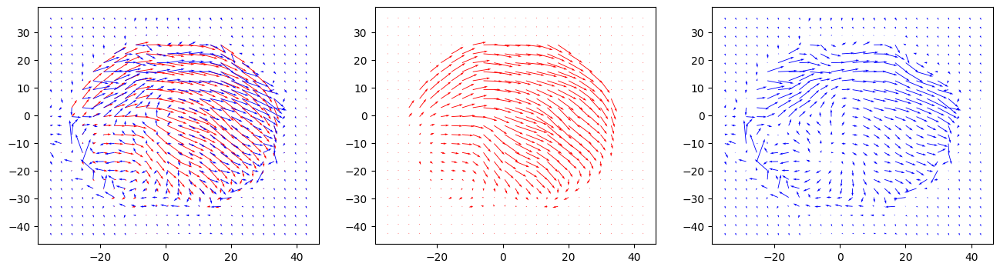

MI:
0.6421013294741773
SI:
0.8243900617939557


In [13]:
for i in range(40):
    print(i)
    j=i*addp
    plt.figure(figsize=(16, 4))
    plt.subplot(1, 3, 1)
    plt.quiver(spatial_grid[:,:,0],spatial_grid[:,:,1],v_train[:,:,j,0],v_train[:,:,j,1],color='r')
    plt.quiver(spatial_grid[:,:,0],spatial_grid[:,:,1],pltpredict[:,:,j,0],pltpredict[:,:,j,1],color='b')
    plt.subplot(1, 3, 2)
    plt.quiver(spatial_grid[:,:,0],spatial_grid[:,:,1],v_train[:,:,j,0],v_train[:,:,j,1],color='r')
    #plt.quiver(spatial_grid[:,:,1],spatial_grid[:,:,0],pltpredict[:,:,i,0],pltpredict[:,:,i,1],color='b')
    plt.subplot(1, 3, 3)
    #plt.quiver(spatial_grid[:,:,1],spatial_grid[:,:,0],u_dot_train[:,:,i+1,0],u_dot_train[:,:,i+1,1],color='r')
    plt.quiver(spatial_grid[:,:,0],spatial_grid[:,:,1],pltpredict[:,:,j,0],pltpredict[:,:,j,1],color='b')
    plt.show()
    miscore(pltpredict[:,:,j,],v_train[:,:,j,:])
    siscore(pltpredict[:,:,j,],v_train[:,:,j,:])